# Visualization notebook for the ground roll removal examples

### Author: F. Brandolin
- This notebook reproduces the figure of the ground roll removal section of the paper.

- The notebook is provided with filtering routines such as Sparse Radon inversion and f-k filtering (as well as high-pass filter).

- The notebooks leverages the PINNslope results saved in the folder precomputed_results to reproduce the figures. 

In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
from scipy import signal, ndimage
import matplotlib
from matplotlib.gridspec import GridSpec
import matplotlib.pyplot as plt
import pylops

from signal_sep_pinns.utils import *
from signal_sep_pinns.plotting import *

plotting_style()

In [3]:
gr_synth = {'dir':'../data/ground_roll/synth_data.npy',
            'ox': 266, 'dx':18.78, 'nx':266+267, 
            'ot':0, 'dt':0.004, 'nt':320+306,
            'nsub':2
            }

gr_sand_dunes = {'dir':'../data/ground_roll/sand_dunes.npy',
            'ox': 48, 'dx':50, 'nx':78, 
            'ot':0, 'dt':0.004, 'nt':512,
            'nsub':1
            }

gr_kaust = {'dir':'../data/ground_roll/GRKAUST.npy',
            'ox': 76, 'dx':2, 'nx':76+41, 
            'ot':0, 'dt':0.001, 'nt':500,
            'nsub':1
            }

# Synthetic data

In [4]:
# Load the data:
par = gr_synth
data = np.load(par['dir']).T
print('Data shape:',data.shape)

# Data dimensions:
ox, dx,  nx = par['ox'], par['dx'], par['nx']
ot, dt, nt = par['ot'], par['dt'], par['nt']
dim_x = int(nx-ox); dim_t = int(nt-ot) 
x = (np.arange(dim_x)+ ox)* dx
x = np.reshape(x, (dim_x, 1) )
t = ((np.arange(dim_t)+ ot) * dt)*1e3
t = np.reshape(t, (dim_t, 1) )

# Subsample factor:
nsub = par['nsub'] # (if set to 1 no subsampling)

# Create restriction operator:
traces_index = np.arange( dim_x )
traces_index_sub = traces_index[::nsub]  
Rop = pylops.Restriction([dim_x, dim_t], 
                         iava=traces_index_sub, 
                         axis=0, 
                         dtype="float64" 
                         )
print('Restriction Op. shape:',Rop.shape)

# Apply restriction Operator to the data:
data_obs, datamask = ROp(Rop, data, traces_index_sub, dim_t)

Data shape: (267, 626)
Restriction Op. shape: (83884, 167142)
Subsampled data shape: (626, 134)
data_mask shape: (626, 267)


#### Sparse Radon inversion

In [5]:
# Define Radon operator :
npx = 500
px = np.linspace(-.5, .5, npx)

RLop = pylops.signalprocessing.Radon2D(t[:,0]/1e3, 
                                    (x[:,0]-x[0,0])/1e3, 
                                    px, 
                                    centeredh=False, 
                                    kind="hyperbolic", 
                                    interp=False, 
                                    engine="numba"
                                    )

In [6]:
# Sparse Radon inversion by FISTA
xinv, niter, cost = pylops.optimization.sparsity.fista(RLop, 
                                                    datamask.T.ravel(),
                                                    niter=16, 
                                                    eps=1e-1
                                                    )
data_radon = xinv.reshape(RLop.dims)

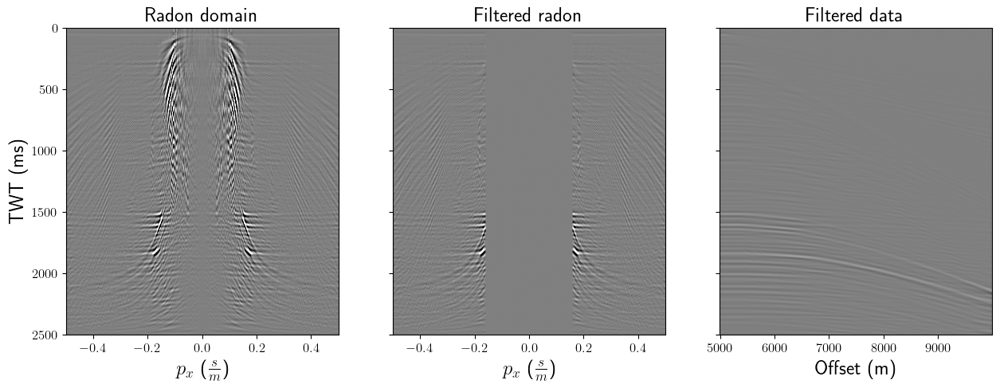

In [7]:
# Filter by zeros masking:
xfilt = np.zeros_like(data_radon)
c=170  #150
xfilt[:c] = data_radon[:c]
xfilt[330:] = data_radon[330:]
# Apply Radon operator to the filter data:
data_filt = RLop * xfilt

# Figure:
fig, ax = plt.subplots(1,3,figsize=(15,5))
vmax=0.001; vmin=-vmax

ax[0].imshow(data_radon.T, vmin=vmin,vmax=vmax, extent=(px[0], px[-1], t[-1], t[0]), cmap='gray')
ax[0].set_title('Radon domain')
ax[0].set_xlabel(r'$p_x$ ($\frac{s}{m}$)')
ax[0].set_ylabel('TWT (ms)')
ax[0].axis('tight')

ax[1].imshow(xfilt.T, cmap='gray', vmin=vmin, vmax=vmax,  extent=(px[0], px[-1], t[-1], t[0]))
ax[1].set_title('Filtered radon')
ax[1].set_yticklabels([])
ax[1].set_xlabel(r'$p_x$ ($\frac{s}{m}$)')
ax[1].axis('tight')

ax[2].imshow(data_filt.T, vmin=-0.2, vmax=0.2, extent=(x[0], x[-1], t[-1], t[0]), cmap='gray')
ax[2].set_title('Filtered data')
ax[2].set_yticklabels([])
ax[2].set_xlabel('Offset (m)')
ax[2].axis('tight')
plt.show()

#### f-k filtering

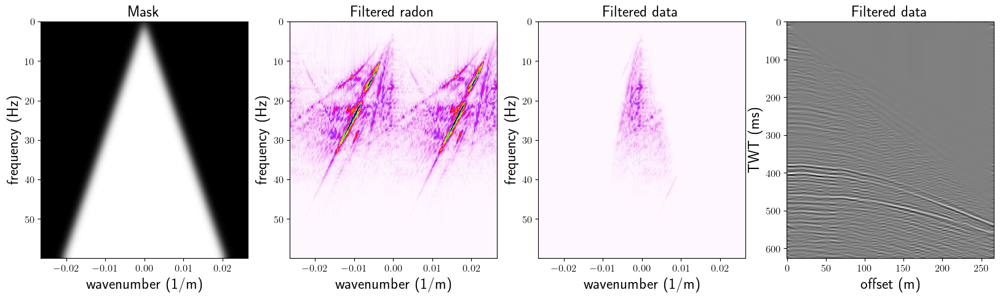

In [8]:
# FFT of subsampled data:
f, kx = np.fft.fftfreq(dim_t, dt), np.fft.fftfreq(dim_x, dx)
FFTsub = np.fft.fft2(datamask)
# Compute mask:
gaussian_mask =  fk_mask( dim_t, dt, dim_x, dx, v=6000, smooth=5. )
# Apply masking:
masked_data = gaussian_mask * np.fft.fftshift((FFTsub), axes=1)
# IFFT:
filterdataFT = np.fft.ifftshift(masked_data, axes=1)


fig, ax = plt.subplots(1,4,figsize=(20,5))
vmax=0.01; vmin=-vmax
limit_plot=150
ax[0].imshow(gaussian_mask[:nt//2], cmap='gray', extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]))
ax[0].set_title('Mask')
ax[0].set_xlabel('wavenumber (1/m)')
ax[0].set_ylabel('frequency (Hz)')
ax[0].axis('tight')

ax[1].imshow(np.fft.fftshift(np.abs(FFTsub[:180]), axes=1), cmap='gist_ncar_r', vmin=0, vmax=400, extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]) )
ax[1].set_title('Filtered radon')
ax[1].set_xlabel('wavenumber (1/m)')
ax[1].set_ylabel('frequency (Hz)')
ax[1].axis('tight')

ax[2].imshow(np.abs(masked_data[:180]), cmap='gist_ncar_r', vmin=0, vmax=400, extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]) )
ax[2].set_title('Filtered data')
ax[2].set_xlabel('wavenumber (1/m)')
ax[2].set_ylabel('frequency (Hz)')
ax[2].axis('tight')

ax[3].imshow(np.real(np.fft.ifft2(filterdataFT)), vmin=-0.1, vmax=0.1,cmap='gray')
ax[3].set_title('Filtered data')
ax[3].set_xlabel('offset (m)')
ax[3].set_ylabel('TWT (ms)')
ax[3].axis('tight')
plt.show()

#### Approximating the analytical slope of ground roll and reflections

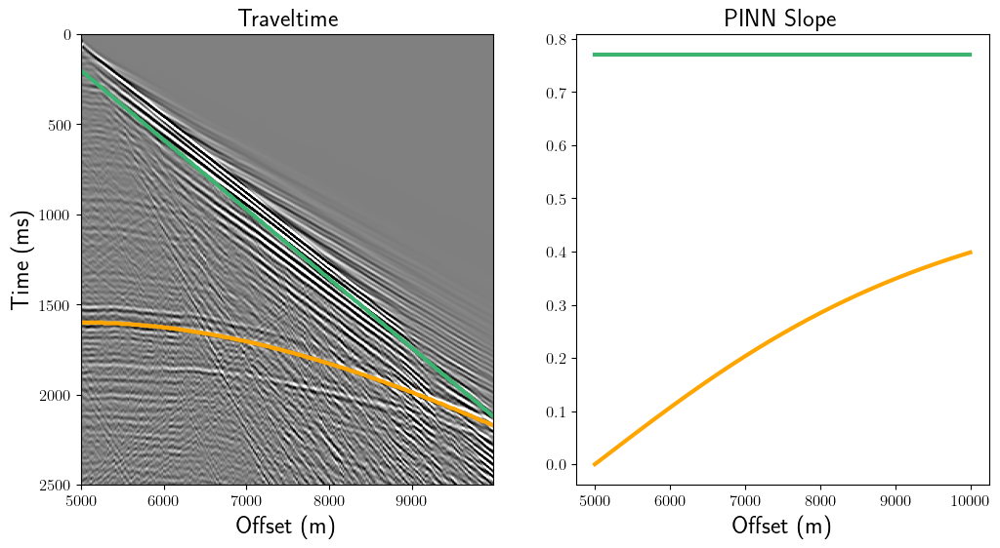

In [9]:
# Define traveltime curve along which slopes will be compared
vrms = 3.4 # (m/ms)
t0 = 1600 # (ms)
tevent = np.sqrt(t0**2 + ((x-x[0])**2) / (vrms**2) )
itevent = np.round(tevent/(dt*1e3)).astype(np.int64)

# Convert analytical guessed slop eto PINN values :
pinn_ref_slope = slope_analytic_to_pinn(x,
                                  t, 
                                  t0,
                                  vrms,
                                  hyperb=True
                                  )

# Define traveltime curve along which slopes will be compared
vrmsl = 2.6 # (m/ms)
t0l = 200 # (ms)
teventl = t0l + (x-x[0]) / (vrmsl) 
iteventl = np.round(teventl/(dt*1e3)).astype(np.int64)

pinn_gr_slope = slope_analytic_to_pinn(x,
                                 t, 
                                 t0,
                                 vrmsl,
                                 hyperb=False
                                 )

fig, ax = plt.subplots(1,2, figsize=(12,6), gridspec_kw={'width_ratios': [1, 1]})

ax[0].imshow(data.T, cmap='gray', vmin=-.2, vmax=.2, extent=(x[0], x[-1], t[-1], t[0]))
ax[0].plot(x, t[itevent[:,0]], c='orange', lw=3)
ax[0].plot(x, t[iteventl[:,0]], c='mediumseagreen', lw=3)
ax[0].set_title('Traveltime')
ax[0].set_xlabel('Offset (m)')
ax[0].set_ylabel('Time (ms)')
ax[0].axis('tight')

ax[1].plot(x, pinn_ref_slope, linewidth=3, c='orange')
ax[1].plot(x, pinn_gr_slope, linewidth=3, c='mediumseagreen')
ax[1].set_xlabel('Offset (m)')
ax[1].set_title('PINN Slope')
ax[1].axis('tight')

plt.show()

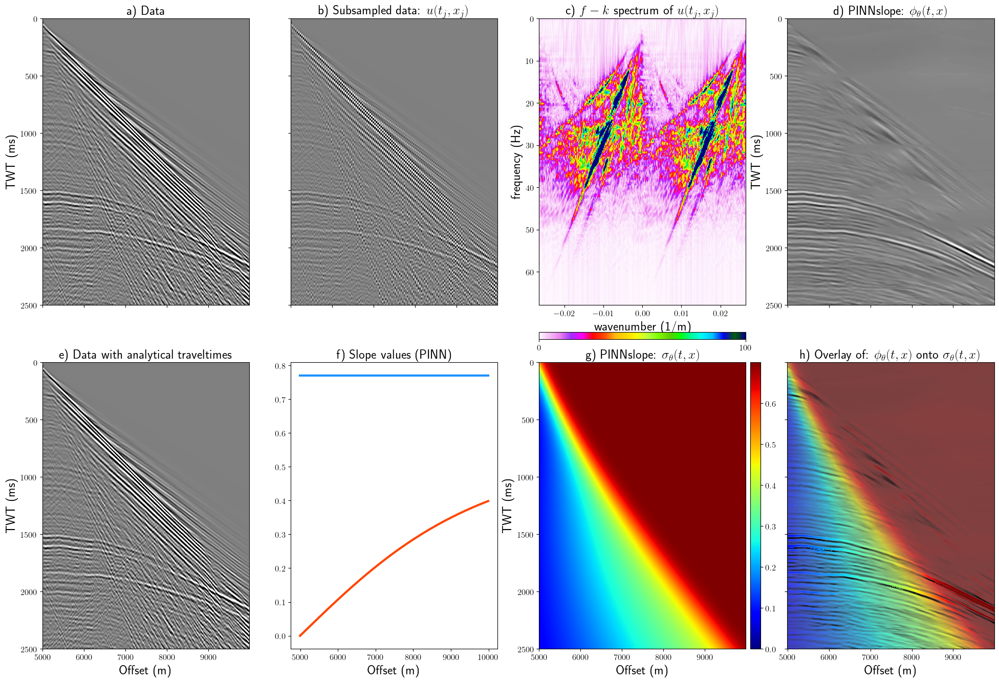

In [10]:
pinn_u = np.load('../data/precomputed_results/ground_roll/synth/u.npy')
slope_u = np.load('../data/precomputed_results/ground_roll/synth/slope.npy')
filtered_data = np.real(np.fft.ifft2(filterdataFT))

# Display CMP and Trace selected:
fig, axs = plt.subplots(2, 4, figsize=(24, 16), gridspec_kw={'width_ratios': [1, 1, 1, 1]})
vmin=-.2; vmax=.2
CMP = axs[0][0].imshow(data.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0, 0], x[-1, -1], t[-1, -1], t[0, 0]))
axs[0][0].set_ylabel('TWT (ms)')
axs[0][0].set_title('a) Data')
axs[0][0].set_xticklabels([])
axs[0][0].axis('tight')

CMP1 = axs[0][1].imshow(datamask, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0, 0], x[-1, -1], t[-1, -1], t[0, 0]))
axs[0][1].set_yticklabels([])
axs[0][1].set_xticklabels([])
axs[0][1].set_title('b) Subsampled data: ' + r' $u(t_{j}, x_{j})$')
axs[0][1].axis('tight')

f, kx = np.fft.fftfreq(dim_t, dt), np.fft.fftfreq(dim_x, dx)
FFTsub = np.fft.fft2(datamask[:,:])
limit_plot=170
FFTsubdata=axs[0][2].imshow(np.fft.fftshift(np.abs(FFTsub[:limit_plot]), axes=1), cmap='gist_ncar_r', vmin=0, vmax=100, extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]) )
axs[0][2].set_xlabel('wavenumber (1/m)')
axs[0][2].set_ylabel('frequency (Hz)')
axs[0][2].set_title('c) ' + '$f-k$ spectrum of' + r' $u(t_{j}, x_{j})$')
axs[0][2].axis('tight')
cb=axs[0][2].inset_axes([0, -0.12, 1, 0.025]) 
fig.colorbar(FFTsubdata, cax=cb, ticks=[ 0, 100], orientation='horizontal')

axs[0][3].imshow(pinn_u, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
# axs[0][1].set_xlabel('Offset (m)')
axs[0][3].set_ylabel('TWT (ms)')
# axs[0][3].set_yticklabels([])
axs[0][3].set_title('d) PINNslope: '+r'$\phi_{\theta}(t,x)$' )
axs[0][3].set_xticklabels([])
axs[0][3].axis('tight')


CMP = axs[1][0].imshow(data.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0, 0], x[-1, -1], t[-1, -1], t[0, 0]))
axs[1][0].set_xlabel('Offset (m)')
# axs[1][0].plot(x[:,:], pinn_gr_slope[:,0], c='dodgerblue', lw=3)
# axs[1][0].plot(x, pinn_ref_slope[:,0], 'orangered', lw=3)
axs[1][0].set_ylabel('TWT (ms)')
axs[1][0].set_title('e) Data with analytical traveltimes')
axs[1][0].axis('tight')

axs[1][1].plot(x, pinn_gr_slope, c='dodgerblue', lw=3)
axs[1][1].plot(x, pinn_ref_slope, 'orangered', lw=3)
axs[1][1].set_xlabel('Offset (m)')
axs[1][1].set_title('f) Slope values (PINN)')
axs[1][1].axis('tight')

axs[1][2].imshow(slope_u, cmap='jet', vmin=0, vmax=np.max(slope_u),  extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][2].set_xlabel('Offset (m)')
axs[1][2].set_ylabel('TWT (ms)')
axs[1][2].set_title('g) PINNslope: '+r'$\sigma_{\theta}(t,x)$' )
# fig.colorbar(SLOPE, ax=axs[3])
axs[1][2].axis('tight')


gray= matplotlib.colormaps['gray']
gray._init() # create the _lut array, with rgba values
alphas = np.linspace(1, 0, gray.N+3)
gray._lut[:,-1] = alphas
SLOPE =axs[1][3].imshow(slope_u, cmap='jet', vmin=0, vmax=np.max(slope_u),  extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][3].imshow(pinn_u, cmap=gray, vmin=-0.1, vmax=0.1, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][3].set_yticklabels([])
axs[1][3].set_xlabel('Offset (m)')
axs[1][3].set_title('h) Overlay of: ' + r'$\phi_{\theta}(t,x)$' + ' onto ' + r'$\sigma_{\theta}(t,x)$' )
axs[1][3].axis('tight')
cb=axs[1][3].inset_axes([-0.18, 0, .05, 1]) 
# cb=axs[1][3].inset_axes([0.0, -0.3, 1, .07]) 
fig.colorbar(SLOPE, cax=cb, orientation='vertical')
# plt.savefig('/home/brandof/Desktop/Figures/GR/GR_synthintro.png', dpi=50, format='png', bbox_inches='tight')

plt.show()

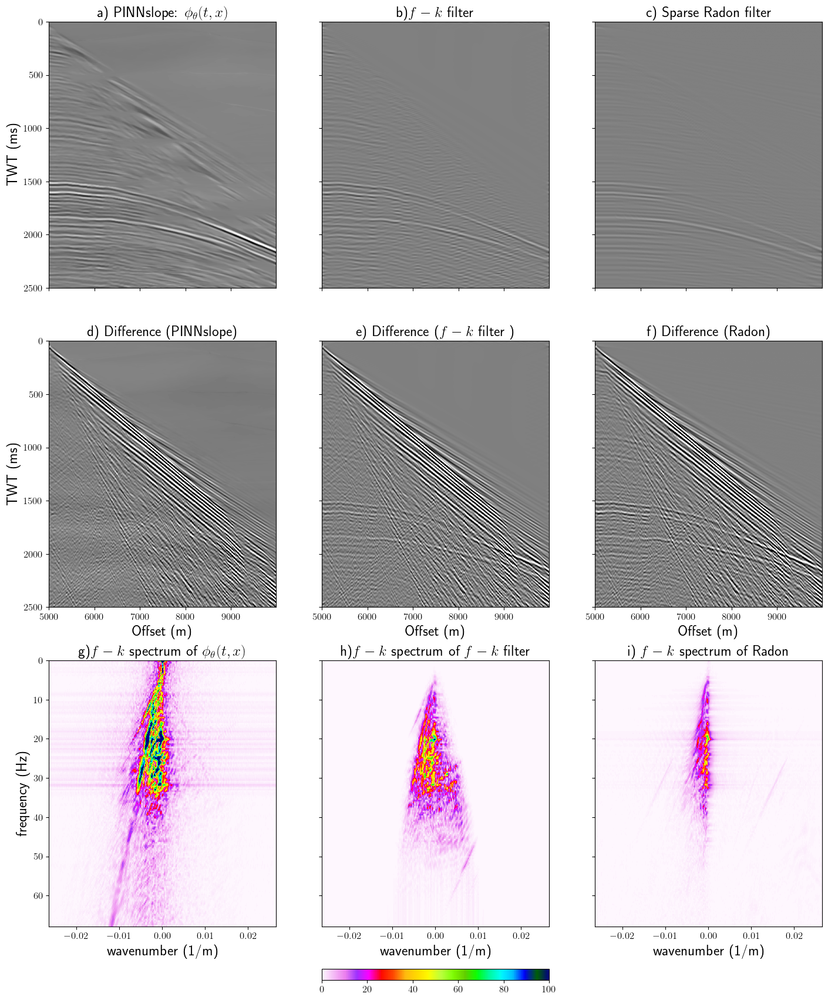

In [11]:
# Results:
fig, axs = plt.subplots(3, 3,  figsize=(17, 20), gridspec_kw={'width_ratios': [1, 1, 1]})

vmin=-0.2; vmax=0.2


OUT=axs[0][0].imshow(pinn_u, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
# axs[0][1].set_xlabel('Offset (m)')
axs[0][0].set_ylabel('TWT (ms)')
# axs[0][0].set_yticklabels([])
axs[0][0].set_title('a) PINNslope: '+r'$\phi_{\theta}(t,x)$' )
axs[0][0].set_xticklabels([])
axs[0][0].axis('tight')

axs[1][0].imshow((data.T-pinn_u), cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][0].set_ylabel('TWT (ms)')
# axs[1][0].set_yticklabels([])
axs[1][0].set_xlabel('Offset (m)')
axs[1][0].set_title('d) Difference (PINNslope)' )
# fig.colorbar(DIFF, ax=axs[2])
axs[1][0].axis('tight')

FFTpinn_u = np.fft.fft2(pinn_u[:,:])
fftpinnu=axs[2][0].imshow(np.fft.fftshift(np.abs(FFTpinn_u[:limit_plot]), axes=1), cmap='gist_ncar_r', vmin=0, vmax=100, extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]) )
# axs[0][].set_xlabel('Offset (m)')
axs[2][0].set_ylabel('frequency (Hz)')
axs[2][0].set_xlabel('wavenumber (1/m)')
axs[2][0].set_title('g)' + r'$f-k$ ' + 'spectrum of '+r'$\phi_{\theta}(t,x)$' )
# fig.colorbar(DIFF, ax=axs[2])
axs[2][0].axis('tight')

OUT=axs[0][1].imshow(filtered_data, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
# axs[0][1].set_xlabel('Offset (m)')
# axs[0][1].set_ylabel('TWT (ms)')
axs[0][1].set_yticklabels([])
axs[0][1].set_title('b)' + r'$f-k$ ' + 'filter ' )
axs[0][1].set_xticklabels([])
axs[0][1].axis('tight')

axs[1][1].imshow((data.T-filtered_data), cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
# axs[1][1].set_ylabel('TWT (ms)')
axs[1][1].set_yticklabels([])
axs[1][1].set_xlabel('Offset (m)')
axs[1][1].set_title('e) Difference ('+ r'$f-k$ ' + 'filter )' )
# fig.colorbar(DIFF, ax=axs[2])
axs[1][1].axis('tight')

FFTfk = np.fft.fft2(filtered_data)
axs[2][1].imshow(np.fft.fftshift(np.abs(FFTfk[:limit_plot]), axes=1), cmap='gist_ncar_r', vmin=0, vmax=100, extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]) )
# axs[0][].set_xlabel('Offset (m)')
axs[2][1].set_yticklabels([])
axs[2][1].set_xlabel('wavenumber (1/m)')
axs[2][1].set_title('h)' + r'$f-k$ ' + 'spectrum of '+  r'$f-k$ ' + 'filter')
# fig.colorbar(DIFF, ax=axs[2])
axs[2][1].axis('tight')


OUT=axs[0][2].imshow(data_filt.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
# axs[0][1].set_xlabel('Offset (m)')
# axs[0][2].set_ylabel('TWT (ms)')
axs[0][2].set_yticklabels([])
axs[0][2].set_title('c) Sparse Radon filter' )
axs[0][2].set_xticklabels([])
axs[0][2].axis('tight')

axs[1][2].imshow((data.T-data_filt.T), cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
# axs[1][2].set_ylabel('TWT (ms)')
axs[1][2].set_yticklabels([])
axs[1][2].set_xlabel('Offset (m)')
axs[1][2].set_title('f) Difference (Radon)' )
# fig.colorbar(DIFF, ax=axs[2])
axs[1][2].axis('tight')

FFTdata_filt = np.fft.fft2(data_filt.T)
axs[2][2].imshow(np.fft.fftshift(np.abs(FFTdata_filt[:limit_plot]), axes=1), cmap='gist_ncar_r', vmin=0, vmax=100, extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]) )
axs[2][2].set_xlabel('wavenumber (1/m)')
axs[2][2].set_yticklabels([])
# axs[2][2].set_xticklabels([])
axs[2][2].set_title('i) ' + r'$f-k$ ' + 'spectrum of Radon')
# fig.colorbar(DIFF, ax=axs[2])
axs[2][2].axis('tight')

cb=axs[2][1].inset_axes([0, -0.2, 1, 0.04]) 
fig.colorbar(fftpinnu, cax=cb,  orientation='horizontal')

# plt.savefig('/home/brandof/Documents/macfb/plots_SSPINN_article/GRsynth_results.png', dpi=300, format='png', bbox_inches='tight')
# plt.savefig('/home/brandof/Desktop/Figures/GR/GRsynth_results.png', dpi=80, format='png', bbox_inches='tight')


plt.show()

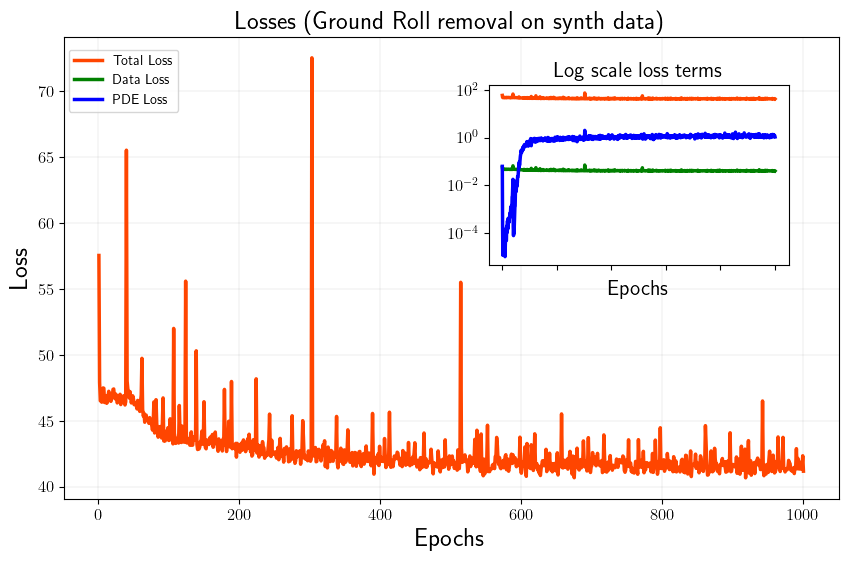

In [32]:
# Loading losses:
sslosstot = np.load('../data/precomputed_results/ground_roll/synth/losstot2K.npy')
sslossdata = np.load('../data/precomputed_results/ground_roll/synth/lossdata2K.npy')
sslossphy = np.load('../data/precomputed_results/ground_roll/synth/lossphy2K.npy')

# Plotting losses:
fig, axs = plt.subplots(figsize=(10,6))

epochs1 = 1000; epochs_axis = np.linspace(1, epochs1, epochs1)

axs.plot(epochs_axis, sslosstot, '-', color='orangered', linewidth=2.5)
axs.set_xlabel('Epochs')
axs.set_ylabel('Loss')
axs.set_title('Losses (Ground Roll removal on synth data)')
axs.grid(color='grey', linestyle='-', linewidth=0.1)

# These are in unitless percentages of the figure size. (0,0 is bottom left)
left, bottom, width, height = [0.55, 0.5, 0.3, 0.3]
ax2 = fig.add_axes([left, bottom, width, height])


ax2.plot(epochs_axis, sslosstot, '-', color='orangered', linewidth=2.5)
ax2.plot(epochs_axis, sslossdata, '-', color='green', linewidth=2.5)
ax2.plot(epochs_axis, sslossphy, '-', color='blue', linewidth=2.5)
ax2.set_yticklabels([]); 
ax2.set_xticklabels([]);
ax2.set_xlabel('Epochs', fontsize='small')
ax2.set_yscale('log')
ax2.set_title('Log scale loss terms', fontsize='small')
ax2.legend(['Total Loss ', 'Data Loss', 'PDE Loss'], loc = (-1.4, .85))

# plt.savefig('/home/brandof/Desktop/Figures/GR/lossgrsynth.png', dpi=150, format='png', bbox_inches='tight')
plt.show()

# Saudi Arabia sand dunes dataset

In [12]:
# Load the data:
par = gr_sand_dunes
data = np.load(par['dir']).T
print('Data shape:',data.shape)

# Data dimensions:
ox, dx,  nx = par['ox'], par['dx'], par['nx']
ot, dt, nt = par['ot'], par['dt'], par['nt']
dim_x = int(nx-ox); dim_t = int(nt-ot) 
x = (np.arange(dim_x)+ ox)* dx
x = np.reshape(x, (dim_x, 1) )
t = ((np.arange(dim_t)+ ot) * dt)*1e3
t = np.reshape(t, (dim_t, 1) )

Data shape: (30, 512)


Wn 0.2


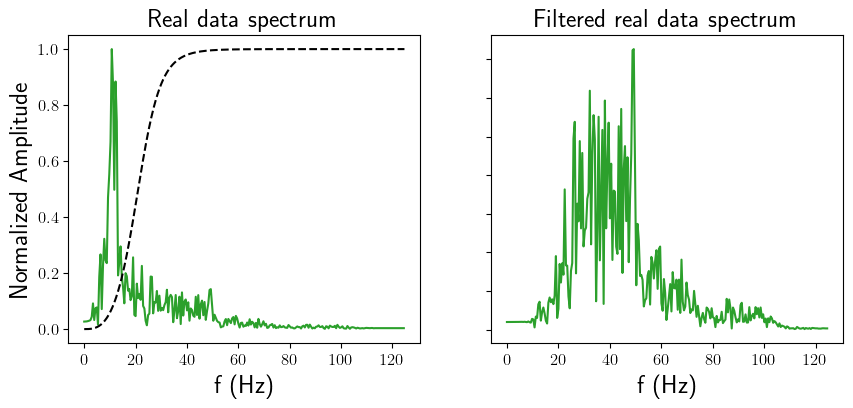

In [13]:
u = np.load('../data/precomputed_results/ground_roll/sasd/2der/u.npy').T
slope = np.load('../data/precomputed_results/ground_roll/sasd/2der/slope.npy')

clean_pwd = np.load('../data/precomputed_results/ground_roll/sasd/clean1.npy')
clean_pwd = clean_pwd/np.max(clean_pwd)
clean_pwd = clean_pwd[:,48:-18]
diff_pwd = data-clean_pwd.T
# 1st derivative:
D1 = pylops.FirstDerivative((dim_x,dim_t ) )
data_der = D1@data.ravel()
datadt1 = data_der.reshape((dim_x,dim_t ))

# 2nd derivative:
D2 = pylops.SecondDerivative((dim_x,dim_t ) )
data_der2 = D2@data.ravel()
datadt2 = data_der2.reshape((dim_x,dim_t ))

# High-pass filtering
clean_hf, b, a = filtering(data.T, filter_order=3, fc=25, dt=dt, filter_type='highpass')

f = np.fft.fftfreq(nt, dt)
F = np.fft.fft(np.average(data.T, axis=1))

fig, axs = plt.subplots(1, 2, figsize=(10, 4), gridspec_kw={'width_ratios': [1, 1]})
limit1 = int(nt/2)
limit2 = int(f.shape[0]/2)
axs[0].plot(f[:limit1],(np.abs(F[:limit1]))/np.max(np.abs(F)),color='C2')

w, h = signal.freqz(b, a)
axs[0].plot(rad_sample_to_hz(w, 1/dt), abs(h), color='k', linewidth=1.5, linestyle='--')

axs[0].set_title('Real data spectrum')
axs[0].set_xlabel('f (Hz)')
axs[0].set_ylabel('Normalized Amplitude')

Ffiltered = np.fft.fft(np.mean(clean_hf, axis=1))
axs[1].plot(f[:limit2],(np.abs(Ffiltered[:limit2]))/np.max(np.abs(F)),color='C2')
axs[1].set_title('Filtered real data spectrum')
axs[1].set_xlabel('f (Hz)')
axs[1].set_yticklabels([])
plt.show()

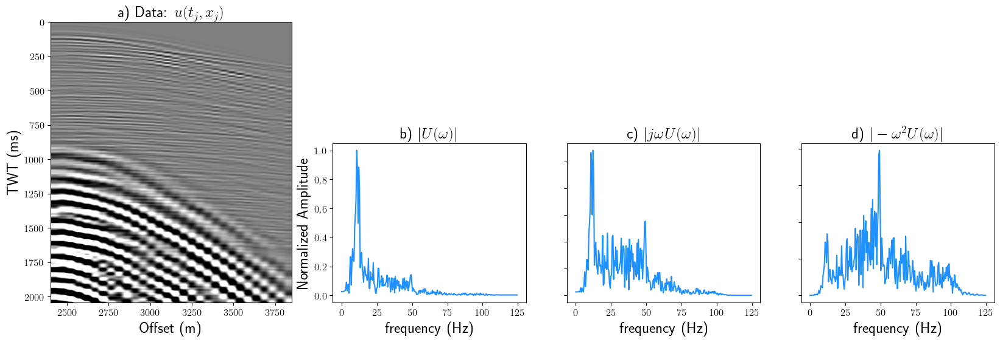

In [14]:

fig = plt.figure(figsize=(20, 6))

gs = GridSpec(2, 4, figure=fig,  width_ratios=[1, 0.8, 0.8, 0.8], height_ratios=[0.6, 1])
ax1 = fig.add_subplot(gs[:, 0])
# ax2 = fig.add_subplot(gs[:, 1])
ax3 = fig.add_subplot(gs[1:, 1])
ax4 = fig.add_subplot(gs[1:, 2])
ax5 = fig.add_subplot(gs[1:, 3])

vmin=-.2; vmax=.2
ax1.imshow(data.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0, 0], x[-1, -1], t[-1, -1], t[0, 0]))
ax1.set_xlabel('Offset (m)')
ax1.set_ylabel('TWT (ms)')
ax1.set_title('a) Data:'+r' $u(t_{j}, x_{j})$')
ax1.axis('tight')

# Visualizing frequency spectrum of the data:
f = np.fft.fftfreq(nt, dt)
F = np.fft.fft(np.average(data.T ,axis=1))
limit1 = int(nt/2)
limit2 = int(f.shape[0]/2)
ax3.plot( f[:limit1],(np.abs(F[:limit1]))/np.max(np.abs(F) ), 'dodgerblue')
ax3.set_title('b) ' + r'$|U(\omega)|$')
ax3.set_xlabel('frequency (Hz)')
ax3.set_ylabel('Normalized Amplitude')

FFTdatadt1 = np.fft.fft(np.average(datadt1.T, axis=1))
ax4.plot( f[:limit2], (np.abs(FFTdatadt1[:limit2]))/np.max(np.abs(F) ), 'dodgerblue')
ax4.set_title('c) ' +r'$|j\omega U(\omega)|$')
ax4.set_xlabel('frequency (Hz)')
ax4.set_yticklabels([])

FFTdatadt2 = np.fft.fft(np.average(datadt2.T, axis=1))
ax5.plot( f[:limit2], (np.abs(FFTdatadt2[:limit2]))/np.max(np.abs(F) ), 'dodgerblue')
ax5.set_title('d) ' +r'$|-\omega^{2}U(\omega)|$')
ax5.set_xlabel('frequency (Hz)')
ax5.set_yticklabels([])
# plt.savefig('/home/brandof/Desktop/Figures/GR/GRSAD_intro.png', dpi=50, format='png', bbox_inches='tight')
plt.show()


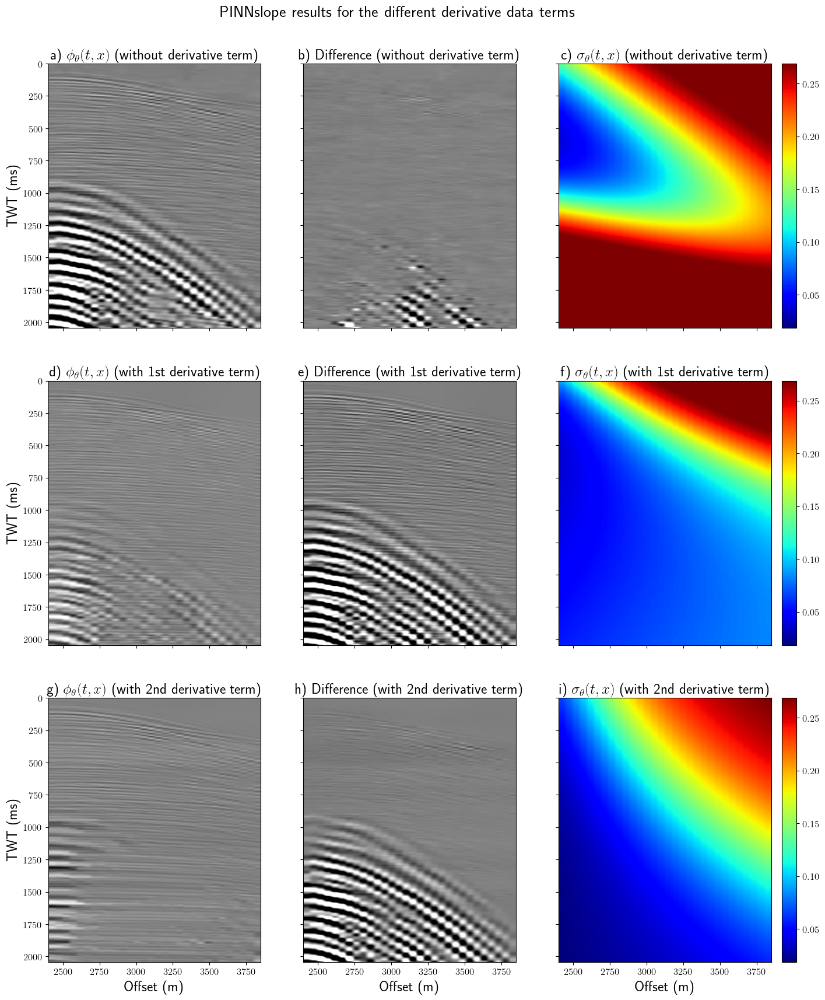

In [15]:
u_no_der = np.load('../data/precomputed_results/ground_roll/sasd/noder/u.npy')
slope_no_der = np.load('../data/precomputed_results/ground_roll/sasd/noder/slope.npy')

u_der = np.load('../data/precomputed_results/ground_roll/sasd/1der/u.npy')
slope_der = np.load('../data/precomputed_results/ground_roll/sasd/1der/slope.npy')

# Results:
fig, axs = plt.subplots(3, 3, figsize=(16, 20), gridspec_kw={'width_ratios': [1, 1, 1]})
fig.suptitle('PINNslope results for the different derivative data terms', fontsize=20, y=0.93) 
vmin=-0.3; vmax=0.3

axs[0][0].imshow(u_no_der, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][0].set_xticklabels([])
axs[0][0].set_ylabel('TWT (ms)')
axs[0][0].set_title('a) '+ r'$\phi_{\theta}(t,x)$' + ' (without derivative term)')
axs[0][0].axis('tight')

axs[0][1].imshow(data.T-u_no_der, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][1].set_xticklabels([])
axs[0][1].set_yticklabels([])
axs[0][1].set_title('b) Difference (without derivative term)' )
axs[0][1].axis('tight')

slnd=axs[0][2].imshow(slope_no_der, cmap='jet',vmin=np.min(slope), vmax=np.max(slope), extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][2].set_xticklabels([])
axs[0][2].set_yticklabels([])
axs[0][2].set_title('c) ' + r'$\sigma_{\theta}(t,x)$' + ' (without derivative term)')
axs[0][2].axis('tight')

cb0=axs[0][2].inset_axes([1.05, 0, .07, 1]) 
fig.colorbar(slnd, cax=cb0)


axs[1][0].imshow(u_der, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][0].set_xticklabels([])
axs[1][0].set_ylabel('TWT (ms)')
axs[1][0].set_title('d) '+ r'$\phi_{\theta}(t,x)$' + ' (with 1st derivative term)')
axs[1][0].axis('tight')

axs[1][1].imshow(data.T-u_der, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][1].set_xticklabels([])
axs[1][1].set_yticklabels([])
axs[1][1].set_title('e) Difference (with 1st derivative term)' )
axs[1][1].axis('tight')

axs[1][2].imshow(slope_der, cmap='jet',vmin=np.min(slope), vmax=np.max(slope), extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][2].set_xticklabels([])
axs[1][2].set_yticklabels([])
axs[1][2].set_title('f) ' + r'$\sigma_{\theta}(t,x)$' + ' (with 1st derivative term)')
axs[1][2].axis('tight')

cb1=axs[1][2].inset_axes([1.05, 0, .07, 1]) 
fig.colorbar(slnd, cax=cb1)


axs[2][0].imshow(u.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[2][0].set_xlabel('Offset (m)')
axs[2][0].set_ylabel('TWT (ms)')
axs[2][0].set_title('g) '+ r'$\phi_{\theta}(t,x)$' + ' (with 2nd derivative term)')
# fig.colorbar(CMP, ax=axs[0])
axs[2][0].axis('tight')

axs[2][1].imshow(data.T-u.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[2][1].set_xlabel('Offset (m)')
axs[2][1].set_yticklabels([])
axs[2][1].set_title('h) Difference (with 2nd derivative term)' )
# fig.colorbar(OUT, ax=axs[1])
axs[2][1].axis('tight')

axs[2][2].imshow(slope, cmap='jet',vmin=np.min(slope), vmax=np.max(slope), extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[2][2].set_xlabel('Offset (m)')
axs[2][2].set_yticklabels([])
axs[2][2].set_title( 'i) ' + r'$\sigma_{\theta}(t,x)$' + ' (with 2nd derivative term)' )
axs[2][2].axis('tight')

cb2=axs[2][2].inset_axes([1.05, 0, .07, 1]) 
fig.colorbar(slnd, cax=cb2)

# plt.savefig('/home/brandof/Documents/macfb/plots_SSPINN_article/GRSAD_res_derivs.png', dpi=300, format='png', bbox_inches='tight')
# plt.savefig('/home/brandof/Desktop/Figures/GR/GRSAD_res_derivs.png', dpi=50, format='png', bbox_inches='tight')

plt.show()

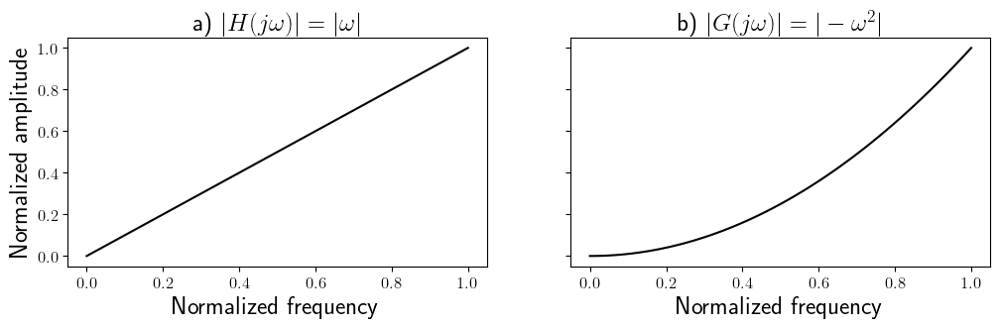

In [16]:
freq = np.linspace(0,1,100)
omega = 2*np.pi*freq

fig, axs = plt.subplots(1, 2, figsize=(12, 3), gridspec_kw={'width_ratios': [1, 1]})
axs[0].plot(freq, omega/np.max(omega), 'k')
axs[0].set_title("a) "+ r'$|H(j \omega)|=|\omega|$')
axs[0].set_xlabel('Normalized frequency')
axs[0].set_ylabel('Normalized amplitude')
# axs[0].legend(['Data spectrum', 'Filter f. response'])

FFTdatadt1 = np.fft.fft(np.mean(datadt1.T, axis=1))
axs[1].plot( freq, (omega**2)/np.max(omega**2), 'k')
axs[1].set_title("b) "+r'$|G(j \omega)|=|-\omega^{2}|$')
axs[1].set_xlabel('Normalized frequency')
axs[1].set_yticklabels([])
# plt.savefig('/home/brandof/Documents/macfb/plots_DW24_houston/freq_res_ders.png', dpi=300, format='png', bbox_inches='tight')
# plt.savefig('/home/brandof/Desktop/Figures/freq_res_ders.png', dpi=80, format='png', bbox_inches='tight')

plt.show()

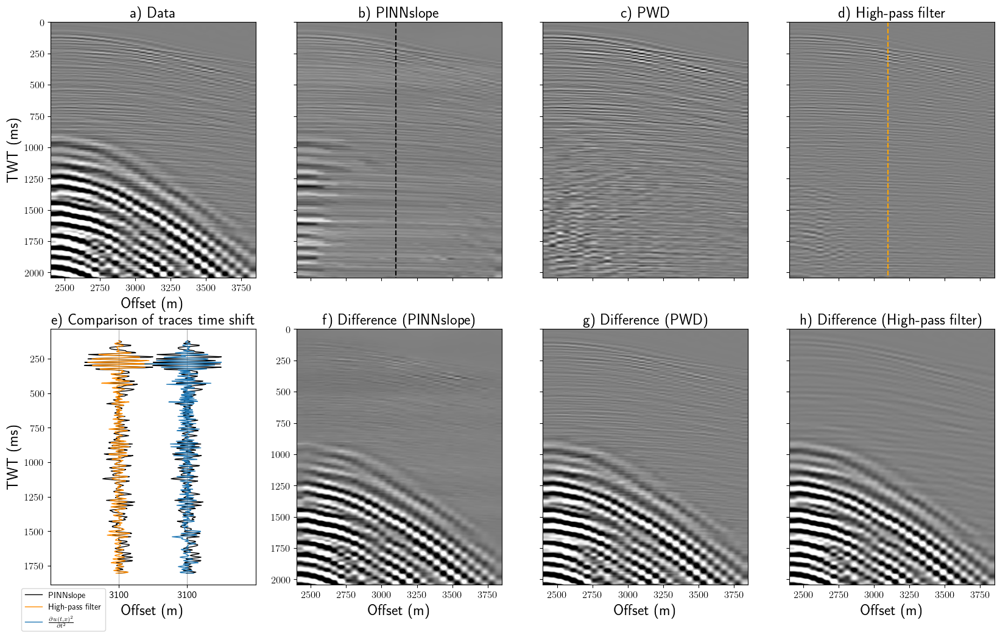

In [17]:
# Results:
fig, axs = plt.subplots(2, 4,  figsize=(20, 12), gridspec_kw={'width_ratios': [1, 1, 1, 1]})

vmin=-0.3; vmax=0.3

axs[0][0].imshow(data.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][0].set_xlabel('Offset (m)')
axs[0][0].set_ylabel('TWT (ms)')
axs[0][0].set_title('a) Data')
# axs[0][0].vlines(48*dx+dx*14, 0, t[-1])
axs[0][0].axis('tight')

axs[0][1].imshow(u.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][1].set_xticklabels([])
axs[0][1].set_yticklabels([])
axs[0][1].set_title('b) PINNslope' )
axs[0][1].vlines(48*dx+dx*14, 0, t[-1], 'k', '--')
axs[0][1].axis('tight')

axs[0][2].imshow(clean_pwd, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][2].set_xticklabels([])
axs[0][2].set_yticklabels([])
axs[0][2].set_title('c) PWD' )
axs[0][2].axis('tight')

axs[0][3].imshow(clean_hf, cmap='gray',  vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][3].set_xticklabels([])
axs[0][3].set_yticklabels([])
axs[0][3].set_title('d) High-pass filter' )
axs[0][3].vlines(48*dx+dx*14, 0, t[-1], 'orange', '--')
axs[0][3].axis('tight')

g = 30 #290
g2= -60
trace=14
traces_list = [ clean_hf[g:g2, trace], datadt2.T[g:g2, trace] ]
gain_plt=0.5

for i in range(0, len(traces_list)):
    if i==0: colortr='darkorange' 
    else: colortr='C0'
    axs[1][0].plot( gain_plt * u.T[g:g2,trace]/np.max(u.T[g:g2,trace]) + i, t[g:g2] , lw=1, c='k' )
    axs[1][0].plot( gain_plt * traces_list[i]/ np.max(traces_list[i]) + i, t[g:g2], lw=1, c=colortr )
    
axs[1][0].set_xticks([0, 1], minor=False)
axs[1][0].set_xticklabels([ (ox+trace)*dx, (ox+trace)*dx ])
axs[1][0].grid(visible=True, which='major', axis='x')
axs[1][0].invert_yaxis()
axs[1][0].set_xmargin(3)
axs[1][0].set_ylabel('TWT (ms)')
axs[1][0].set_xlabel('Offset (m)')
axs[1][0].set_title('e) Comparison of traces time shift')
axs[1][0].set_xlim((-1., 2.))
axs[1][0].legend(['PINNslope', 'High-pass filter', r'$ \frac{\partial u(t,x)^{2}}{\partial t^{2} }$'], loc = (-.14, -.18))
leg = axs[1][0].get_legend()
leg.legend_handles[0].set_color('k')
leg.legend_handles[1].set_color('darkorange')
leg.legend_handles[2].set_color('C0')



axs[1][1].imshow((data - u).T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][1].set_xlabel('Offset (m)')
# axs[1][1].set_ylabel('TWT (ms)')
axs[1][1].set_title('f) Difference (PINNslope)' )
axs[1][1].axis('tight')

axs[1][2].imshow(diff_pwd.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][2].set_xlabel('Offset (m)')
axs[1][2].set_yticklabels([])
axs[1][2].set_title('g) Difference (PWD)' )
axs[1][2].axis('tight')

axs[1][3].imshow((data.T - clean_hf), cmap='gray',  vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][3].set_xlabel('Offset (m)')
axs[1][3].set_yticklabels([])
axs[1][3].set_title('h) Difference (High-pass filter)' )
axs[1][3].axis('tight')

# plt.savefig('/home/brandof/Desktop/Figures/GR/GRSAD_res_filters.png', dpi=80, format='png', bbox_inches='tight')


# plt.savefig('/home/brandof/Documents/macfb/plots_SSPINN_article/GRSAD_res_filters.png', dpi=300, format='png', bbox_inches='tight')
plt.show()


In [34]:
losstot_no = np.load('../data/precomputed_results/ground_roll/sasd/noder/losstot2K.npy')
lossdata_no = np.load('../data/precomputed_results/ground_roll/sasd/noder/lossdata2K.npy')
lossphy_no = np.load('../data/precomputed_results/ground_roll/sasd/noder/lossphy2K.npy')

losstot_1d = np.load('../data/precomputed_results/ground_roll/sasd/1der/losstot2K.npy')
lossdata_1d = np.load('../data/precomputed_results/ground_roll/sasd/1der/lossdata2K.npy')
lossphy_1d = np.load('../data/precomputed_results/ground_roll/sasd/1der/lossphy2K.npy')
lossder_1d = np.load('../data/precomputed_results/ground_roll/sasd/1der/lossder2K.npy')

losstot_2d = np.load('../data/precomputed_results/ground_roll/sasd/2der/losstot2K.npy')
lossdata_2d = np.load('../data/precomputed_results/ground_roll/sasd/2der/lossdata2K.npy')
lossphy_2d = np.load('../data/precomputed_results/ground_roll/sasd/2der/lossphy2K.npy')
lossder_2d = np.load('../data/precomputed_results/ground_roll/sasd/2der/lossder2K.npy')

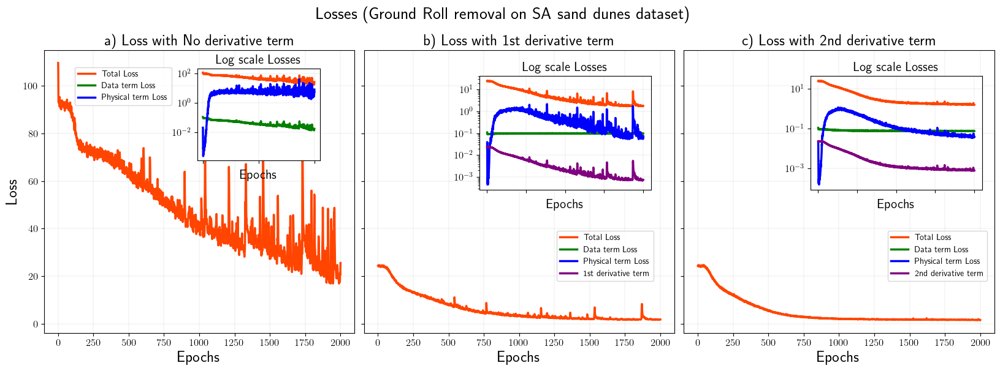

In [37]:

fig, axs = plt.subplots(1, 3,sharey=True, figsize=(20,6))
fig.subplots_adjust(wspace=.03)

fig.suptitle('Losses (Ground Roll removal on SA sand dunes dataset)', fontsize=20, y=1)

epochs1 = 2000; epochs_axis1 = np.linspace(1, epochs1, epochs1)
left, bottom, width, height = [0.25, 0.58, 0.1, 0.25]
ax = fig.add_axes([left, bottom, width, height])

ax.plot(epochs_axis1, losstot_no, '-', color='orangered', linewidth=2.5)
ax.plot(epochs_axis1, lossdata_no, '-', color='green', linewidth=2.5)
ax.plot(epochs_axis1, lossphy_no, '-', color='blue', linewidth=2.5)

ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_xlabel('Epochs', fontsize='small')
ax.set_yscale('log')
ax.set_title('Log scale Losses', fontsize='small')
ax.grid(color='grey', linestyle='-', linewidth=0.1)

axs[0].plot(epochs_axis1, losstot_no, '-', color='orangered', linewidth=2.5)
ax.legend(['Total Loss ', 'Data term Loss', 'Physical term Loss'], loc=(-1, 0.6)) # loc = 'upper right')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].set_title('a) Loss with No derivative term')
axs[0].grid(color='grey', linestyle='-', linewidth=0.1)
# axs[0].set_yscale('log')


epochs2 = 2000; epochs_axis2 = np.linspace(1, epochs2, epochs2)


# These are in unitless percentages of the figure size. (0,0 is bottom left)
left2, bottom2, width2, height2 = [0.48, 0.50, 0.14, 0.31]
ax2 = fig.add_axes([left2, bottom2, width2, height2])

ax2.plot(epochs_axis2, losstot_1d, '-', color='orangered', linewidth=2.5)
ax2.plot(epochs_axis2, lossdata_1d, '-', color='green', linewidth=2.5)
ax2.plot(epochs_axis2, lossphy_1d, '-', color='blue', linewidth=2.5)
ax2.plot(epochs_axis2, lossder_1d, '-', color='purple', linewidth=2.5)

ax2.set_yticklabels([])
ax2.set_xticklabels([])
ax2.set_xlabel('Epochs', fontsize='small')
ax2.set_yscale('log')
ax2.set_title('Log scale Losses', fontsize='small')
ax2.grid(color='grey', linestyle='-', linewidth=0.1)

axs[1].plot(epochs_axis2, losstot_1d, '-', color='orangered', linewidth=2.5)
ax2.legend(['Total Loss ', 'Data term Loss', 'Physical term Loss', '1st derivative term'], loc=( 0.45, -0.8)) # loc = 'upper right')
axs[1].set_xlabel('Epochs')
# axs[1].set_ylabel('Loss',fontsize=15)
axs[1].set_title('b) Loss with 1st derivative term')
axs[1].grid(color='grey', linestyle='-', linewidth=0.1)
# axs[1].set_yscale('log')


# epochs1 = 2000; epochs_axis1 = np.linspace(1, epochs1, epochs1)
left, bottom, width, height = [0.75, 0.50, 0.14, 0.31]
ax3 = fig.add_axes([left, bottom, width, height])

ax3.plot(epochs_axis1, losstot_2d, '-', color='orangered', linewidth=2.5)
ax3.plot(epochs_axis1, lossdata_2d, '-', color='green', linewidth=2.5)
ax3.plot(epochs_axis1, lossphy_2d, '-', color='blue', linewidth=2.5)
ax3.plot(epochs_axis2, lossder_2d, '-', color='purple', linewidth=2.5)

ax3.set_yticklabels([])
ax3.set_xticklabels([])
ax3.set_xlabel('Epochs', fontsize='small')
ax3.set_yscale('log')
ax3.set_title('Log scale Losses', fontsize='small')
ax3.grid(color='grey', linestyle='-', linewidth=0.1)

axs[2].plot(epochs_axis1, losstot_2d, '-', color='orangered', linewidth=2.5)
ax3.legend(['Total Loss ', 'Data term Loss', 'Physical term Loss', '2nd derivative term'], loc=( 0.45, -0.8)) # loc = 'upper right')
axs[2].set_xlabel('Epochs')
axs[2].set_title('c) Loss with 2nd derivative term')
axs[2].grid(color='grey', linestyle='-', linewidth=0.1)
# axs[2].set_yscale('log')
# plt.savefig('/home/brandof/Desktop/Figures/GR/GRSAD_loss.png', dpi=150, format='png', bbox_inches='tight')

plt.show()

# KAUST dataset


In [20]:
# Load the data:
par = gr_kaust
data = np.load(par['dir']).T
print('Data shape:',data.shape)

# Data dimensions:
ox, dx,  nx = par['ox'], par['dx'], par['nx']
ot, dt, nt = par['ot'], par['dt'], par['nt']
dim_x = int(nx-ox); dim_t = int(nt-ot) 
x = (np.arange(dim_x)+ ox)* dx
x = np.reshape(x, (dim_x, 1) )
t = ((np.arange(dim_t)+ ot) * dt)*1e3
t = np.reshape(t, (dim_t, 1) )

u = np.load("../data/precomputed_results/ground_roll/kaust/u.npy")
no_der = np.load('../data/precomputed_results/ground_roll/kaust/noderu.npy')
slope = np.load("../data/precomputed_results/ground_roll/kaust/slope.npy")


Data shape: (41, 500)


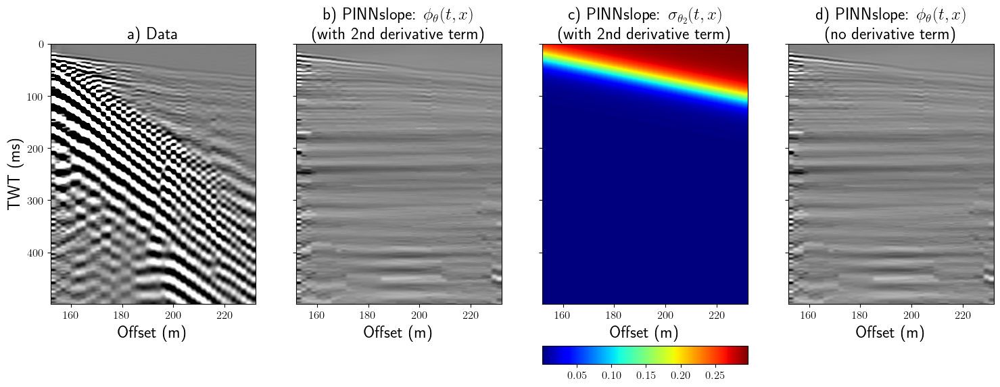

In [21]:
# Results:
fig, axs = plt.subplots(1, 4, sharey=True, figsize=(18, 5), gridspec_kw={'width_ratios': [1, 1, 1, 1]})

vmin=-0.1; vmax=0.1

CMP=axs[0].imshow(data.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0].set_xlabel('Offset (m)')
axs[0].set_ylabel('TWT (ms)')
axs[0].set_title('a) Data')
# fig.colorbar(CMP, ax=axs[0])
axs[0].axis('tight')

OUT=axs[1].imshow(u, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1].set_xlabel('Offset (m)')
# axs[1].set_ylabel('TWT (ms)')
axs[1].set_title('b) PINNslope: ' + r'$\phi_{\theta}(t,x)$ ' + '\n (with 2nd derivative term)')
# fig.colorbar(OUT, ax=axs[1])
axs[1].axis('tight')

SLOPE=axs[2].imshow(slope, cmap='jet', extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[2].set_xlabel('Offset (m)')
# axs[3].set_ylabel('TWT (ms)')
axs[2].set_title('c) PINNslope: ' + r'$ \sigma_{\theta_{2}}(t,x)$'+ '\n (with 2nd derivative term)' )
# fig.colorbar(SLOPE, ax=axs[3])
axs[2].axis('tight')
# plt.savefig(saveres + '/u_out.png', dpi =150, bbox_inches='tight')

cb=axs[2].inset_axes([0, -0.23, 1, .07]) 
fig.colorbar(SLOPE, cax=cb, orientation='horizontal')

axs[3].imshow(no_der, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[3].set_xlabel('Offset (m)')
# axs[2].set_ylabel('TWT (ms)')
axs[3].set_title('d) PINNslope: ' + r'$\phi_{\theta}(t,x) $' + '\n (no derivative term)' )
# fig.colorbar(DIFF, ax=axs[2])
axs[3].axis('tight')


# plt.savefig('/home/brandof/Documents/macfb/plots_SSPINN_article/kaustseg_res.png', dpi=300, format='png', bbox_inches='tight')
# plt.savefig('/home/brandof/Desktop/Figures/GR/kaustseg_res.png', dpi=80, format='png', bbox_inches='tight')

plt.show()

#### Radon sparse inversion

In [22]:
# Radon Adjoint
npx = 500
px = np.linspace(0, 6, npx)

RLop = pylops.signalprocessing.Radon2D(t[:,0]/1e3, 
                                    (x[:,0]-x[0,0])/1e3, 
                                    px, 
                                    centeredh=False, 
                                    kind="linear", 
                                    interp=False, 
                                    engine="numba"
                                    )


# sparse Radon transform
xinv, niter, cost = pylops.optimization.sparsity.fista(RLop, 
    data.ravel(),
    niter=5, 
    eps=1e-4
    )

data_radon_adj = xinv.reshape(RLop.dims)
print(data_radon_adj.shape)

(500, 500)


xfilt (500, 500)


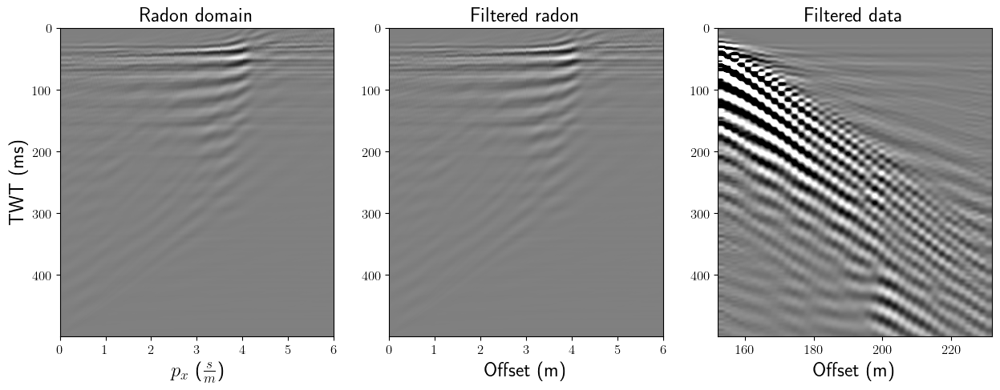

In [23]:
xfilt = np.zeros_like(data_radon_adj)
xfilt2 = np.zeros_like(data_radon_adj)

print('xfilt',xfilt.shape)
a=0
b=0

xfilt[:] = data_radon_adj[:]
# xfilt2[a:] = data_radon_adj[a:]
xfiltfilt =  xfilt

radon = RLop * xfiltfilt


fig, ax = plt.subplots(1,3,figsize=(15,5))
vmax=0.01; vmin=-vmax

ax[0].imshow(data_radon_adj.T, vmin=vmin,vmax=vmax, extent=(px[0], px[-1], t[-1], t[0]), cmap='gray')#cmap=cc.m_diverging_bwg_20_95_c41)
ax[0].set_title('Radon domain')
ax[0].set_xlabel(r'$p_x$ ($\frac{s}{m}$)')
ax[0].set_ylabel('TWT (ms)')
ax[0].axis('tight')

ax[1].imshow(xfiltfilt.T, cmap='gray', vmin=vmin, vmax=vmax,  extent=(px[0], px[-1], t[-1], t[0]))#cmap=cc.m_diverging_bwg_20_95_c41)
ax[1].set_title('Filtered radon')
ax[1].set_xlabel('Offset (m)')
# ax[1].set_ylabel('TWT (ms)')
ax[1].axis('tight')

ax[2].imshow(radon.T, vmin=-0.1, vmax=0.1, extent=(x[0], x[-1], t[-1], t[0]), cmap='gray')#cmap=cc.m_diverging_bwg_20_95_c41)
ax[2].set_title('Filtered data')
ax[2].set_xlabel('Offset (m)')
# ax[1].set_ylabel('TWT (ms)')
ax[2].axis('tight')
plt.show()

# np.save('../data/results/GR2_results9/radon.npy', (data_filt.T)/np.max(data_filt.T[:,:]))

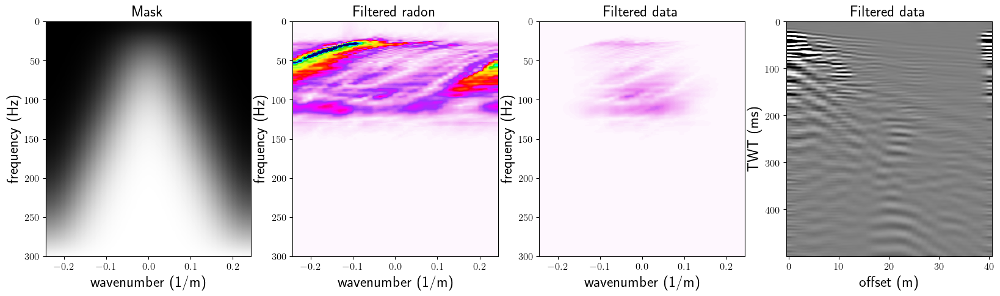

In [24]:
# FFT of subsampled data:
f, kx = np.fft.fftfreq(dim_t, dt), np.fft.fftfreq(dim_x, dx)
FFTsub = np.fft.fft2(data.T)
# Compute mask:
gaussian_mask = fk_mask( dim_t, dt, dim_x, dx, v=2000, smooth=5. )
# Apply masking:
masked_data = gaussian_mask * np.fft.fftshift((FFTsub), axes=1)
# IFFT:
filterdataFT = np.fft.ifftshift(masked_data, axes=1)
fk = np.real(np.fft.ifft2(filterdataFT))

fig, ax = plt.subplots(1,4,figsize=(20,5))
vmax=0.01; vmin=-vmax
limit_plot=150
ax[0].imshow(gaussian_mask[:nt//2], cmap='gray', extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]))
ax[0].set_title('Mask')
ax[0].set_xlabel('wavenumber (1/m)')
ax[0].set_ylabel('frequency (Hz)')
ax[0].axis('tight')

ax[1].imshow(np.fft.fftshift(np.abs(FFTsub[:180]), axes=1), cmap='gist_ncar_r', vmin=0, vmax=400, extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]) )
ax[1].set_title('Filtered radon')
ax[1].set_xlabel('wavenumber (1/m)')
ax[1].set_ylabel('frequency (Hz)')
ax[1].axis('tight')

ax[2].imshow(np.abs(masked_data[:180]), cmap='gist_ncar_r', vmin=0, vmax=400, extent=(np.fft.fftshift(kx)[0], np.fft.fftshift(kx)[-1], f[limit_plot], f[0]) )
ax[2].set_title('Filtered data')
ax[2].set_xlabel('wavenumber (1/m)')
ax[2].set_ylabel('frequency (Hz)')
ax[2].axis('tight')

ax[3].imshow(fk, vmin=-0.1, vmax=0.1, cmap='gray')
ax[3].set_title('Filtered data')
ax[3].set_xlabel('offset (m)')
ax[3].set_ylabel('TWT (ms)')
ax[3].axis('tight')
plt.show()

##### f-k filtering

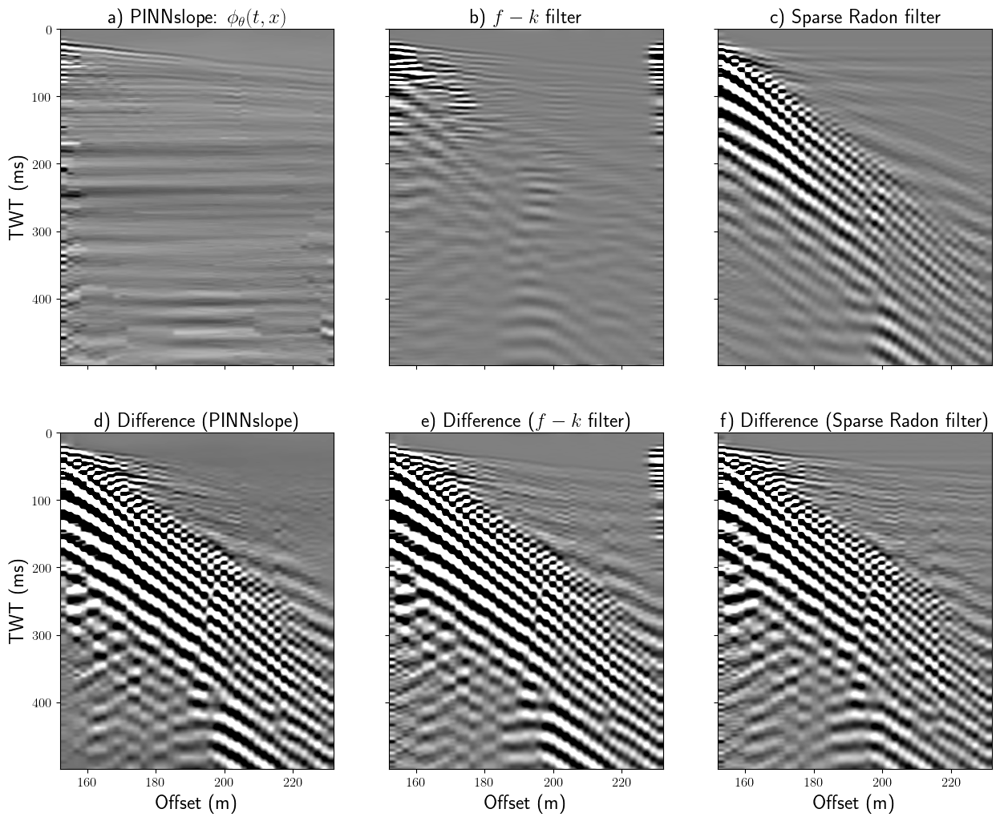

In [25]:
# fk = np.load('/home/brandof/Documents/GRPINNss/data/results/PINNslope_GRKAUST2/fk_kaustseg.npy')
# no_der = np.load('/home/brandof/Documents/GRPINNss/data/results/PINNslope_GRKAUST2_sigma03_testnoder/u.npy')

# Results:
fig, axs = plt.subplots(2, 3, figsize=(15, 12), gridspec_kw={'width_ratios': [1, 1, 1]})

vmin=-0.1; vmax=0.1

# CMP=axs[0][0].imshow(data.T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
# axs[0][0].set_xlabel('Offset (m)')
# axs[0][0].set_ylabel('TWT (ms)')
# axs[0][0].set_title('a) Data')
# # fig.colorbar(CMP, ax=axs[0])
# axs[0][0].axis('tight')

OUT=axs[0][0].imshow(u, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][0].set_xticklabels([])
axs[0][0].set_ylabel('TWT (ms)')
axs[0][0].set_title('a) PINNslope: ' + r'$\phi_{\theta}(t,x)$' )
# fig.colorbar(OUT, ax=axs[1])
axs[0][0].axis('tight')

axs[0][1].imshow(fk, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][1].set_xticklabels([])
axs[0][1].set_yticklabels([])

axs[0][1].set_title('b) $f-k$ filter' )
# fig.colorbar(SLOPE, ax=axs[3])
axs[0][1].axis('tight')

axs[0][2].imshow(radon[:500,:-10].T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[0][2].set_title('c) Sparse Radon filter' )
axs[0][2].set_xticklabels([])
axs[0][2].set_yticklabels([])
axs[0][2].axis('tight')


axs[1][0].imshow((data.T - u), cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][0].set_xlabel('Offset (m)')
axs[1][0].set_ylabel('TWT (ms)')
axs[1][0].set_title('d) Difference (PINNslope)' )
axs[1][0].axis('tight')

axs[1][1].imshow((data.T - fk), cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][1].set_xlabel('Offset (m)')
axs[1][1].set_yticklabels([])
axs[1][1].set_title('e) Difference ($f-k$ filter)' )
axs[1][1].axis('tight')

axs[1][2].imshow((data - radon).T, cmap='gray',  vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[-1,-1], t[0,0]))
axs[1][2].set_xlabel('Offset (m)')
axs[1][2].set_yticklabels([])
axs[1][2].set_title('f) Difference (Sparse Radon filter)' )
axs[1][2].axis('tight')

# plt.savefig('/home/brandof/Documents/macfb/plots_SSPINN_article/kaustseg_res_comp.png', dpi=300, format='png', bbox_inches='tight')
# plt.savefig('/home/brandof/Desktop/Figures/GR/kaustseg_res_comp.png', dpi=80, format='png', bbox_inches='tight')


plt.show()

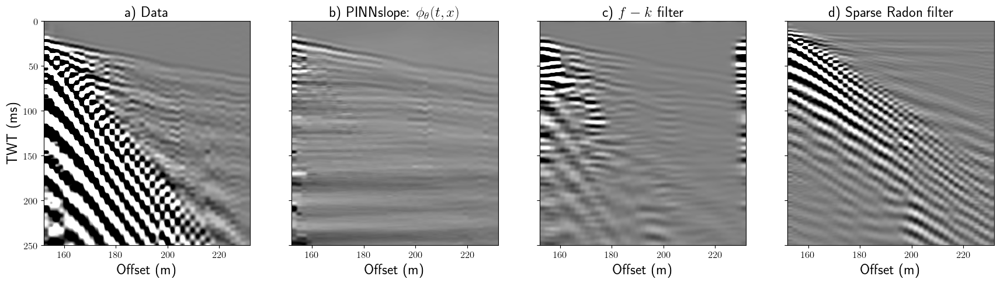

In [26]:
t_stop = 250
# Results:
fig, axs = plt.subplots(1, 4, sharey=True, figsize=(21, 5), gridspec_kw={'width_ratios': [1, 1, 1, 1]})

vmin=-0.1; vmax=0.1

axs[0].imshow(data.T[:t_stop], cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[t_stop,-1], t[0,0]))
axs[0].set_xlabel('Offset (m)')
axs[0].set_ylabel('TWT (ms)')
axs[0].set_title(' a) Data')
axs[0].axis('tight')

axs[1].imshow(u[:t_stop], cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[t_stop,-1], t[0,0]))
axs[1].set_xlabel('Offset (m)')
axs[1].set_title('b) PINNslope: ' + r'$\phi_{\theta}(t,x)$' )
axs[1].axis('tight')

axs[2].imshow(fk[:t_stop], cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[t_stop,-1], t[0,0]))
axs[2].set_xlabel('Offset (m)')
axs[2].set_title('c) $f-k$ filter ' )
axs[2].axis('tight')

axs[3].imshow(radon[:t_stop].T, cmap='gray', vmin=vmin, vmax=vmax, extent=(x[0,0], x[-1,-1], t[t_stop,-1], t[0,0]))
axs[3].set_xlabel('Offset (m)')
axs[3].set_title('d) Sparse Radon filter' )
axs[3].axis('tight')
# plt.savefig('/home/brandof/Desktop/Figures/GR/kaustseg_res_comp_zoom.png', dpi=80, format='png', bbox_inches='tight')

plt.show()